# Exploring Emotional and Multilingual Features In GPT-2-Small

## Import libs and load the models

In [4]:
import os
import torch
from tqdm import tqdm
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from IPython import get_ipython
from IPython.display import IFrame
ipython = get_ipython(); assert ipython is not None
ipython.run_line_magic("load_ext", "autoreload")
ipython.run_line_magic("autoreload", "2")

from datasets import load_dataset  
from transformer_lens import HookedTransformer
from transformer_lens.utils import test_prompt, tokenize_and_concatenate
from sae_lens import SAE, HookedSAETransformer

torch.set_grad_enabled(False)

if torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cuda" if torch.cuda.is_available() else "cpu"

print(f"Device: {device}")

Device: cpu


In [5]:
model = HookedSAETransformer.from_pretrained("gpt2-small", device = device)

sae, cfg_dict, sparsity = SAE.from_pretrained(
    release = "gpt2-small-res-jb",
    sae_id = "blocks.7.hook_resid_pre",
    device = device
)

print(model.cfg, sae.cfg)

e:\Anaconda\envs\interp\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Loaded pretrained model gpt2-small into HookedTransformer
HookedTransformerConfig:
{'act_fn': 'gelu_new',
 'attention_dir': 'causal',
 'attn_only': False,
 'attn_scale': 8.0,
 'attn_scores_soft_cap': -1.0,
 'attn_types': None,
 'checkpoint_index': None,
 'checkpoint_label_type': None,
 'checkpoint_value': None,
 'd_head': 64,
 'd_mlp': 3072,
 'd_model': 768,
 'd_vocab': 50257,
 'd_vocab_out': 50257,
 'decoder_start_token_id': None,
 'default_prepend_bos': True,
 'device': 'cpu',
 'dtype': torch.float32,
 'eps': 1e-05,
 'experts_per_token': None,
 'final_rms': False,
 'from_checkpoint': False,
 'gated_mlp': False,
 'init_mode': 'gpt2',
 'init_weights': False,
 'initializer_range': 0.02886751345948129,
 'load_in_4bit': False,
 'model_name': 'gpt2',
 'n_ctx': 1024,
 'n_devices': 1,
 'n_heads': 12,
 'n_key_value_heads': None,
 'n_layers': 12,
 'n_params': 84934656,
 'normalization_type': 'LNPre',
 'num_experts': None,
 'original_architecture': 'GPT2LMHeadModel',
 'output_logits_soft_cap': 

In [6]:
# get dashboard
def get_dashboard_html(sae_release = "gpt2-small", sae_id="7-res-jb", feature_idx=0):
    html_template = "https://neuronpedia.org/{}/{}/{}?embed=true&embedexplanation=true&embedplots=true&embedtest=true&height=300"
    return html_template.format(sae_release, sae_id, feature_idx)

## Exploring Emotional Features

I believe there are features that can reflect emotions in gpt-2-small.  
I think it's an easy start for me because I can check out the autoencoder features to find out the features that fire most actively.  
Besides, I also want to do some exploration on the features among different layers and different positions of the model.

### Find features that reflect positive emotions
To find the features related to a specific emotion and reduce data deviation, I write five sentences containing the key words for each emotion.  
I choose to look for features that reflect happiness and sadness. Apart from that, I also wonder if the feature that reflects excitedness has something to do with the one reflects happiness(they are alike from the semantic level at least.)

In [7]:
prompt_happy = ["I'll be on a vacation tommorow and I'm so happy.",
          "My mom brings home a new puppy and I'm so happy.",
          "I'm so glad I got the job I wanted.",
          "I feel so happy when I'm with my friends.",
          "I'm so happy I got the promotion I wanted.",]
prompt_sad = ["I'm so sad I lost my wallet.",
          "I broke up with my boyfriend and I'm so sad.",
          "I am so sad now that I want to cry.",
          "I faied my exam and I'm so upset.",
          "She is upset by the terrible news"]
prompt_excited = ["I'm so excited to see my friends.",
                "The concert of my favorite band is tonight and I'm so excited.",
                "I am so excited to go to the party tonight.",
                "I'm so excited to go on a date with my crush.",
                "My parents are coming to visit me and I'm so excited."]

tokens_happy = model.to_str_tokens(prompt_happy)
for i, tokens in enumerate(tokens_happy):
    print(f"Prompt {i}: {tokens}")

Prompt 0: ['<|endoftext|>', 'I', "'ll", ' be', ' on', ' a', ' vacation', ' to', 'mm', 'or', 'ow', ' and', ' I', "'m", ' so', ' happy', '.']
Prompt 1: ['<|endoftext|>', 'My', ' mom', ' brings', ' home', ' a', ' new', ' puppy', ' and', ' I', "'m", ' so', ' happy', '.']
Prompt 2: ['<|endoftext|>', 'I', "'m", ' so', ' glad', ' I', ' got', ' the', ' job', ' I', ' wanted', '.']
Prompt 3: ['<|endoftext|>', 'I', ' feel', ' so', ' happy', ' when', ' I', "'m", ' with', ' my', ' friends', '.']
Prompt 4: ['<|endoftext|>', 'I', "'m", ' so', ' happy', ' I', ' got', ' the', ' promotion', ' I', ' wanted', '.']


In [8]:
# get the positions of the keywords
def get_keyword_id(prompts: list, keywords: list):
    keyword_idxs = []
    prompt_tokens_list = model.to_str_tokens(prompts)
    for prompt_tokens in prompt_tokens_list:
        for keyword in keywords:
            if keyword in prompt_tokens:
                keyword_idxs.append(prompt_tokens.index(keyword))
                break
    return keyword_idxs

happy_idxs = get_keyword_id(prompt_happy, [" happy", " glad"])
sad_idxs = get_keyword_id(prompt_sad, [" sad", " upset"])
excited_idxs = get_keyword_id(prompt_excited, [" excited"])
print(happy_idxs)
print(sad_idxs)
print(excited_idxs)

[15, 12, 4, 4, 4]
[4, 11, 4, 10, 3]
[4, 13, 4, 4, 12]


Now we run the model and get the activations.

In [9]:
# Get the feature activations from the SAE
_, cache_happy = model.run_with_cache_with_saes(prompt_happy, saes=[sae])

for k,v in cache_happy.items():
    if "sae" in k:
        print(k, v.shape)

blocks.7.hook_resid_pre.hook_sae_input torch.Size([5, 17, 768])
blocks.7.hook_resid_pre.hook_sae_acts_pre torch.Size([5, 17, 24576])
blocks.7.hook_resid_pre.hook_sae_acts_post torch.Size([5, 17, 24576])
blocks.7.hook_resid_pre.hook_sae_recons torch.Size([5, 17, 768])
blocks.7.hook_resid_pre.hook_sae_output torch.Size([5, 17, 768])


Take the average value of activations on keywords of happiness among different prompts.

In [10]:
cache_to_study = cache_happy['blocks.7.hook_resid_pre.hook_sae_acts_post']
# Select the activations of the happy keywords
idx_tensor = torch.tensor(happy_idxs).unsqueeze(1).unsqueeze(2).expand(-1, 1, cache_to_study.shape[2])
print(idx_tensor.shape)
cache_happy_filtered = torch.gather(cache_to_study, 1, idx_tensor)
print(cache_to_study.shape)
cache_happy_average = cache_happy_filtered.mean(dim=0).squeeze()
print(cache_happy_average.shape)

torch.Size([5, 1, 24576])
torch.Size([5, 17, 24576])
torch.Size([24576])


Draw a plot for the happiness feature

In [12]:
px.line(
    cache_happy_average.tolist(),
    title="Feature activations at the keyword for 'happy'",
    labels={"index": "Feature", "value": "Activation"},
).show()
happy_acts, happy_feat_ids = torch.topk(cache_happy_average, 3)
print(happy_feat_ids)

tensor([ 2392,  9840, 21753])


We can find that the feature 2392, 9840 and 3247 fire most actively for happy emotion.  
Since we have the dashboard for gpt2-small, we can check if the features we found are related to happiness.

In [66]:
for val, id in zip(happy_acts, happy_feat_ids):
    print(f"Feature {id} fired {val:.2f}")
    html = get_dashboard_html(sae_release = "gpt2-small", sae_id="7-res-jb", feature_idx=id)
    display(IFrame(html, width=1200, height=300))

Feature 2392 fired 24.29


Feature 9840 fired 16.96


Feature 21753 fired 15.74


Obviously the three features we get are related to happiness and positive emotions.

### Find features that reflect sadness and excitedness in the same way

In [14]:
_, cache_sad = model.run_with_cache_with_saes(prompt_sad, saes=[sae])
cache_to_study = cache_sad['blocks.7.hook_resid_pre.hook_sae_acts_post']
# Select the activations of the sad keywords
idx_tensor = torch.tensor(sad_idxs).unsqueeze(1).unsqueeze(2).expand(-1, 1, cache_to_study.shape[2])
cache_sad_filtered = torch.gather(cache_to_study, 1, idx_tensor)
cache_sad_average = cache_sad_filtered.mean(dim=0).squeeze()

px.line(
    cache_sad_average.tolist(),
    title="Feature activations at the keyword for 'sad'",
    labels={"index": "Feature", "value": "Activation"},
).show()
sad_acts, sad_feat_ids = torch.topk(cache_sad_average, 3)
print(sad_feat_ids)
html = get_dashboard_html(sae_release = "gpt2-small", sae_id="7-res-jb", feature_idx=sad_feat_ids[0])
display(IFrame(html, width=1200, height=300))

tensor([ 2045, 23774, 10866])


In [16]:
_, cache_excited = model.run_with_cache_with_saes(prompt_excited, saes=[sae])
cache_to_study = cache_excited['blocks.7.hook_resid_pre.hook_sae_acts_post']
# Select the activations of the excited keywords
idx_tensor = torch.tensor(excited_idxs).unsqueeze(1).unsqueeze(2).expand(-1, 1, cache_to_study.shape[2])
cache_excited_filtered = torch.gather(cache_to_study, 1, idx_tensor)
cache_excited_average = cache_excited_filtered.mean(dim=0).squeeze()

px.line(
    cache_excited_average.tolist(),
    title="Feature activations at the keyword for 'excited'",
    labels={"index": "Feature", "value": "Activation"},
).show()
excited_acts, excited_feat_ids = torch.topk(cache_excited_average, 3)
print(excited_feat_ids)
html = get_dashboard_html(sae_release = "gpt2-small", sae_id="7-res-jb", feature_idx=excited_feat_ids[0])
display(IFrame(html, width=1200, height=300))

tensor([8935, 9840, 3247])


### Compare the features related to happiness and excitedness

I want to see the difference between "happy features" and "excited features" since they are both positive emotions.

In [17]:
# for convenience, we set the activation to zero if it is smaller than the 5th top activation
happy_acts, _ = torch.topk(cache_happy_average, 5)
excited_acts, _ = torch.topk(cache_excited_average, 5)
cache_happy_average[cache_happy_average < happy_acts[4]] = 0
cache_excited_average[cache_excited_average < excited_acts[4]] = 0
feature_activation_df = pd.DataFrame(cache_happy_average.tolist(), 
                                     columns = ["happy"],
                                     index = [f"feature_{i}" for i in range(sae.cfg.d_sae)],
)
feature_activation_df["excited"] = cache_excited_average.tolist()

feature_activation_df["both_act"] = feature_activation_df["happy"] * feature_activation_df["excited"]
# get the indexes of features that are not 0
print(type(feature_activation_df["both_act"]))
both_act_feats = feature_activation_df[feature_activation_df["both_act"] > 0]
both_act_ids = both_act_feats.index.tolist()
print(both_act_ids)

fig = px.line(
    feature_activation_df["both_act"],
    title="Features activate on both 'happy' and 'excited'",
    labels={"index": "Feature", "value": "Activation"},
)

fig.show()

<class 'pandas.core.series.Series'>
['feature_3247', 'feature_9840']


In [112]:
for feat_id in both_act_ids:
    html = get_dashboard_html(sae_release = "gpt2-small", sae_id="7-res-jb", feature_idx=feat_id.split("_")[1])
    display(IFrame(html, width=1200, height=300))

Also, I guess that the representations of features activating on the same emotion (i.e. 2392, 9840 and 21753) have high similarities. 
 
To prove this, I try to inspect in the representation of one prompt which expresses happiness and calculate the cosine similarities among representations of different features.  

Note that in order to visualize the similarities using heatmap, I choose to mainly focus on feature 2392, 9840 and 21753 and using negative sampling to get some other features for comparison.


In [18]:
prompt = "I was so happy to see my friends."
tokens = model.to_str_tokens([prompt])[0]
keyword_happy_idx = tokens.index(" happy")
print(tokens, keyword_happy_idx)

_, cache = model.run_with_cache_with_saes([prompt], saes=[sae])
# for key, value in cache.items():
#     if "blocks.7" in key:
#         print(key, value.shape)

cache_residual_act_post = cache['blocks.7.hook_resid_pre.hook_sae_acts_post'][0][keyword_happy_idx]
print(cache_residual_act_post.shape)  # (d_sae,)
fig = px.line(
    cache_residual_act_post,
    title="Features activate on 'happy'",
    labels={"index": "Feature", "value": "Activation"},
).show()


['<|endoftext|>', 'I', ' was', ' so', ' happy', ' to', ' see', ' my', ' friends', '.'] 4
torch.Size([24576])


Negative sampling feature tensor([13871])
Negative sampling feature tensor([23885])
Negative sampling feature tensor([14068])
Negative sampling feature tensor([17702])
Negative sampling feature tensor([21594])
Negative sampling feature tensor([2887])
feat_idx_list tensor([ 2392,  9840, 21753, 13871, 23885, 14068, 17702, 21594,  2887]) torch.Size([9])
sae.W_dec: torch.Size([24576, 768])
sae.W_dec * sae_z: torch.Size([24576, 768])
selected_repr torch.Size([9, 768])
selected_repr_norm torch.Size([9, 768])
cos_sim torch.Size([9, 9])


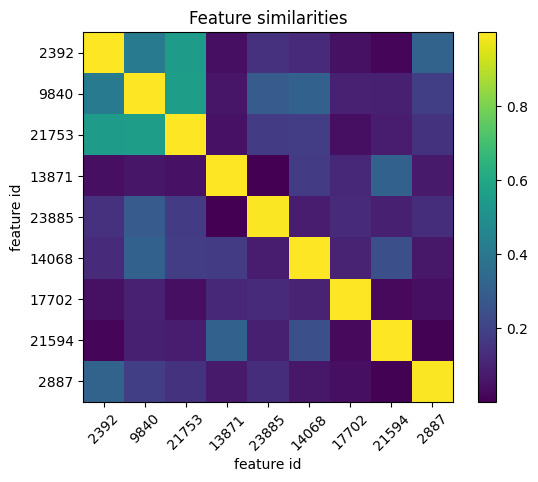

In [337]:

# get feature indexs
feat_idx_list = torch.Tensor(happy_feat_ids)
# negative sampling another 6 features
while len(feat_idx_list) < 9:
    other_feat_idx = torch.randint(0, sae.cfg.d_sae, (1,))
    conditions = [not torch.any(feat_idx_list == other_feat_idx),
                  cache_residual_act_post[other_feat_idx] > 0.1]
    if all(conditions):
    # if not torch.any(feat_idx_list == other_feat_idx):
        feat_idx_list = torch.cat([feat_idx_list, other_feat_idx])
        print(f"Negative sampling feature {other_feat_idx}")
print("feat_idx_list", feat_idx_list, feat_idx_list.shape)  # (9,)

# get representations
feature_directions = sae.W_dec
print("sae.W_dec:", feature_directions.shape)  # (d_sae, d_model)
# multiply element wise: (d_sae, d_model) * (d_sae,) -> (d_sae, d_model)
feature_repr = feature_directions * cache_residual_act_post.unsqueeze(1).expand(-1, feature_directions.shape[1])
print("sae.W_dec * sae_z:", feature_repr.shape)  # (d_sae, d_model)

# select the representations of the features
selected_repr = torch.gather(feature_repr, 0, feat_idx_list.unsqueeze(1).expand(-1, feature_directions.shape[1]))
print("selected_repr", selected_repr.shape)  # (n_feats, d_model)

# calculate cosine similarities matrix(n_feats, n_feats)
selected_repr_norm = torch.norm(selected_repr, dim=1, keepdim=True)
selected_repr_normalized = selected_repr / (selected_repr_norm + 1e-3)
print("selected_repr_norm", selected_repr_normalized.shape)
sim_matrix = torch.mm(selected_repr_normalized, selected_repr_normalized.T)
print("cos_sim", sim_matrix.shape)

# plot heatmap
heatmap = plt.imshow(sim_matrix, cmap='viridis')
plt.colorbar(heatmap)
plt.title('Feature similarities')

plt.xlabel('feature id')
plt.ylabel('feature id')
plt.xticks(np.arange(9), labels=feat_idx_list.numpy(), rotation=45)
plt.yticks(np.arange(9), labels=feat_idx_list.numpy())
plt.savefig('figures\Heatmap.png', dpi=300)

plt.show()


### Features in different layers

Previously I inspected in the 8th layer of gpt-2-small and found some emotional features. Now I want to know if other layers exist similar features, and how are they related to each others and how they change in the model.

In [349]:
print(model.cfg.n_layers)

12


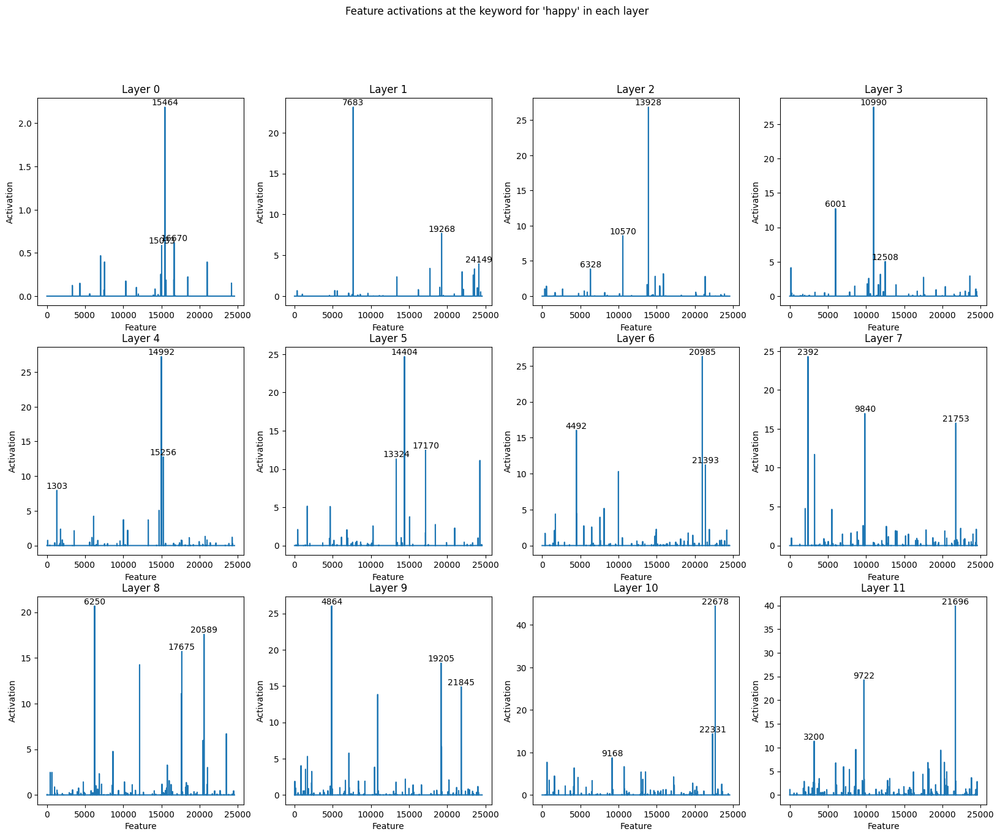

In [398]:
happy_feat_ids_list = []
happy_feat_acts_list = []

# draw plots on 12 layers and put 12 figs in one big figure(3 rows, 4 columns)
fig, axs = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle("Feature activations at the keyword for 'happy' in each layer")

for layer_id in range(model.cfg.n_layers):
    sae, cfg_dict, sparsity = SAE.from_pretrained(
        release = "gpt2-small-res-jb",
        sae_id = f"blocks.{layer_id}.hook_resid_pre",
        device = device
    )
    _, cache_happy = model.run_with_cache_with_saes(prompt_happy, saes=[sae])
    
    cache_to_study = cache_happy[f'blocks.{layer_id}.hook_resid_pre.hook_sae_acts_post']
    idx_tensor = torch.tensor(happy_idxs).unsqueeze(1).unsqueeze(2).expand(-1, 1, cache_to_study.shape[2])
    cache_happy_filtered = torch.gather(cache_to_study, 1, idx_tensor)
    cache_happy_average = cache_happy_filtered.mean(dim=0).squeeze()  # (d_sae,)
    
    # put the subplot in the big figure
    row_id = layer_id // 4
    col_id = layer_id % 4
    axs[row_id, col_id].plot(cache_happy_average.tolist())
    axs[row_id, col_id].set_title(f"Layer {layer_id}")
    axs[row_id, col_id].set_xlabel("Feature")
    axs[row_id, col_id].set_ylabel("Activation")
    
    happy_acts, happy_feat_ids = torch.topk(cache_happy_average, 3)
    happy_feat_ids_list.append(happy_feat_ids)
    happy_feat_acts_list.append(happy_acts)
    # write index id next to the bar in the plot
    for val, id in zip(happy_acts, happy_feat_ids):
        axs[row_id, col_id].text(id, val, f"{id}", ha="center", va="bottom")
plt.savefig('figures\Feature_activations.png', dpi=300)
    

From the figure above, we can find that:
1. Each layer exists more than 3 features that activate on the happy emotion.

2. The positions of activating features are different from those in other layers.  

Though the positions of activating features are different, I guess it's just the problem of feature orders. For example, the feature 7683 in layer_1 may be the same kind or even exactly the same feature as feature 13928 in layer_3, though the positions are different.

In order to prove this, I choose to visualize the feature representations of SAE outputs.

In [ ]:
# get feature indexs
feat_idx_list = torch.stack(happy_feat_ids_list)

reprs = []
for layer_id in range(model.cfg.n_layers):
    sae, cfg_dict, sparsity = SAE.from_pretrained(
        release = "gpt2-small-res-jb",
        sae_id = f"blocks.{layer_id}.hook_resid_pre",
        device = device
    )
    # get representations
    feature_directions = sae.W_dec
    
    # select the representations of the features
    feature_directions = torch.gather(feature_directions, 0, feat_idx_list[layer_id].unsqueeze(1).expand(-1, feature_directions.shape[1]))
    # multiply element wise: (3, d_model) * (3,) -> (3, d_model)
    selected_repr = feature_directions * happy_feat_acts_list[layer_id].unsqueeze(1).expand(-1, feature_directions.shape[1])
    reprs.append(selected_repr)

reprs = torch.cat(reprs)  # (n_feats * 12, d_model)

# calculate cosine similarities matrix(n_feats, n_feats)
repr_norm = torch.norm(reprs, dim=1, keepdim=True)
repr_normalized = reprs / (repr_norm + 1e-3)
sim_matrix = torch.mm(repr_normalized, repr_normalized.T)
print("cos_sim", sim_matrix.shape)

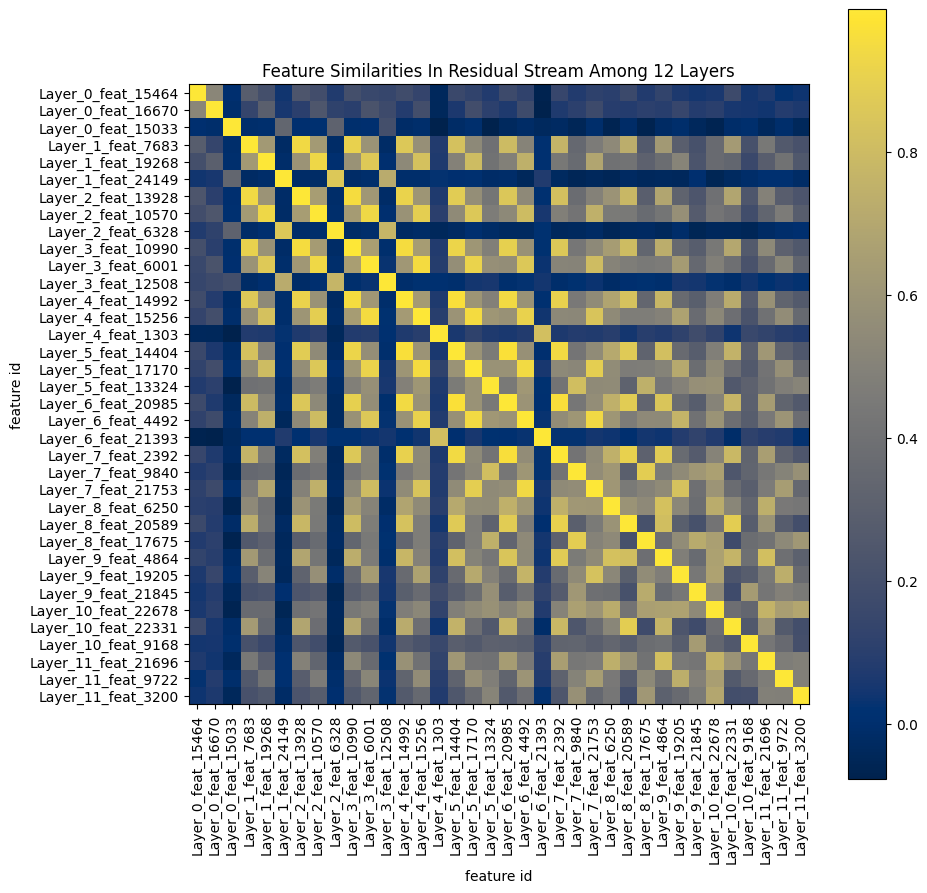

In [404]:
# plot heatmap
plt.figure(figsize=(10, 10))
heatmap = plt.imshow(sim_matrix, cmap='cividis')
plt.colorbar(heatmap)
plt.title('Feature Similarities In Residual Stream Among 12 Layers')

plt.xlabel('feature id')
plt.ylabel('feature id')
labels = [f"Layer_{i}_feat_{id}" for i in range(model.cfg.n_layers) for id in feat_idx_list[i]]
plt.xticks(np.arange(36), labels=labels, rotation=90)
plt.yticks(np.arange(36), labels=labels)
plt.savefig('figures\Heatmap_among_layers.png', dpi=300)

plt.show()

In [416]:
# the similarities between feature 7683 in layer_1 and other features
for i in range(model.cfg.n_layers):
    # preserve 3 floats after the decimal point
    print(f"Feature 7683 in Layer_2 -> features in Layer_{i}:", sim_matrix[i * 3 : i * 3 + 3, 6].numpy().round(3))

Feature 7683 in Layer_2 -> features in Layer_0: [0.234 0.107 0.005]
Feature 7683 in Layer_2 -> features in Layer_1: [ 0.939  0.596 -0.01 ]
Feature 7683 in Layer_2 -> features in Layer_2: [ 1.     0.65  -0.009]
Feature 7683 in Layer_2 -> features in Layer_3: [ 0.954  0.617 -0.012]
Feature 7683 in Layer_2 -> features in Layer_4: [0.912 0.605 0.071]
Feature 7683 in Layer_2 -> features in Layer_5: [0.882 0.568 0.425]
Feature 7683 in Layer_2 -> features in Layer_6: [0.859 0.543 0.01 ]
Feature 7683 in Layer_2 -> features in Layer_7: [0.825 0.375 0.499]
Feature 7683 in Layer_2 -> features in Layer_8: [0.6   0.784 0.289]
Feature 7683 in Layer_2 -> features in Layer_9: [0.689 0.319 0.235]
Feature 7683 in Layer_2 -> features in Layer_10: [0.401 0.691 0.24 ]
Feature 7683 in Layer_2 -> features in Layer_11: [0.498 0.286 0.232]


From the figure above, I got some interesting points about the feature distribution:

1. The features in the first layer have lower similarities with those in later layers. I guess this is because the first layer gets limited information from previous layers, so it cannot express relatively complicated concepts like emotions. I think maybe the first layer contains some low level concepts that are not shown in this figure, which I will explore in the future.

2. A feature in a layer often corresponds to a feature in another layer. For example, feature 7683 in layer_1 corresponds to feature 13928 in layer_2, which has a similarity of 0.939. This means they are related to each other across different layers, sharing similar semantic meanings.

3. A feature in a layer tends to be more alike to features in nearby layers. For example, feature 7683 in layer_1 is more similar to feature 13928 in layer_2 than feature 2392 in layer_7, with a similarity of 0.939 to 0.825. I think it's because the vector spaces of nearby layers are relatively close to each other. When two layers are far from each other, the difference between their vector spaces is significant due to a lot of linear and nonlinear manipulations between layers. Thus the features would share low similarities regardless of similar semantic meanings.

## Explore Multilingual features

I remember gpt-2 can speak French because of the English-to-French translation ability showed in the paper "Language Models are Unsupervised Multitask Learners".  
I'm a language lover so I want to find out the possible multilingual features in gpt-2-small.

### Emotion features in English and French

Following the work I've just done, I continue to work on French.

In [421]:
import circuitsvis as cv

prompt_fr = "J'ai obtenu la promotion que je voulais et je suis heureux."
cv.logits.token_log_probs(
    model.to_tokens(prompt_fr),
    model(prompt_fr)[0].log_softmax(dim=-1),
    model.to_string,
)

We can see that the generation of the word "heureux" requires 3 steps. Though the first token " he" is not generated with a high probability, the model successfully generate the next two tokens. This implies that gpt-2-small has the knowledge of French.

In [ ]:
prompt_fr = "J'ai obtenu la promotion que je voulais et je suis"
answer_fr = "heureux"
test_prompt(prompt_fr, answer_fr, model)


In [23]:
prompt_happy_fr = ["Je vais en vacances demain et je suis tellement heureux.",
                   "Ma mère ramène un nouveau chiot à la maison et je suis tellement heureux.",
                "Je suis tellement heureux d'avoir obtenu le travail que je voulais.",
                "Je me sens tellement heureux quand je suis avec mes amis.",
                "Je suis tellement heureux d'avoir obtenu la promotion que je voulais."]
prompt_excited_fr = ["Je suis tellement excité de voir mes amis.",
                "Le concert de mon groupe préféré est ce soir et je suis tellement excité.",
                "Je suis tellement excité d'aller à la fête ce soir.",
                "Je suis tellement excité de sortir avec mon crush.",
                "Mes parents viennent me rendre visite et je suis tellement excité."]
tokens_happy_fr = model.to_str_tokens(prompt_happy_fr)
tokens_excited_fr = model.to_str_tokens(prompt_excited_fr)
for i, tokens in enumerate(tokens_happy_fr):
    print(f"Prompt {i}: {tokens}")
print("----"*40)
for i, tokens in enumerate(tokens_excited_fr):
    print(f"Prompt {i}: {tokens}")

Prompt 0: ['<|endoftext|>', 'Je', ' v', 'ais', ' en', ' vac', 'ances', ' dem', 'ain', ' et', ' je', ' su', 'is', ' tel', 'lement', ' he', 'ure', 'ux', '.']
Prompt 1: ['<|endoftext|>', 'Ma', ' m', 'ère', ' ram', 'è', 'ne', ' un', ' n', 'ou', 've', 'au', ' ch', 'iot', ' à', ' la', ' ma', 'ison', ' et', ' je', ' su', 'is', ' tel', 'lement', ' he', 'ure', 'ux', '.']
Prompt 2: ['<|endoftext|>', 'Je', ' su', 'is', ' tel', 'lement', ' he', 'ure', 'ux', ' d', "'", 'av', 'oir', ' ob', 'ten', 'u', ' le', ' tra', 'v', 'ail', ' que', ' je', ' v', 'oul', 'ais', '.']
Prompt 3: ['<|endoftext|>', 'Je', ' me', ' sens', ' tel', 'lement', ' he', 'ure', 'ux', ' qu', 'and', ' je', ' su', 'is', ' a', 'vec', ' mes', ' am', 'is', '.']
Prompt 4: ['<|endoftext|>', 'Je', ' su', 'is', ' tel', 'lement', ' he', 'ure', 'ux', ' d', "'", 'av', 'oir', ' ob', 'ten', 'u', ' la', ' promotion', ' que', ' je', ' v', 'oul', 'ais', '.']
------------------------------------------------------------------------------------------

Unlike English, French words are splited by the tokenizer more often because French accounts for a less part than English in the training corpus for the tokenizer. So it's not that easy to use the way I study features in English before.  

To deal with this, I examine the activations on all separated tokens in a French word, and add them together to find out the features that fire on it.

In [24]:
# get the positions of the keywords
def get_multi_keyword_id(prompts: list, keywords: list):
    keyword_idxs = []
    prompt_tokens_list = model.to_str_tokens(prompts)
    for prompt_tokens in prompt_tokens_list:
        idxs = []
        for i, token in enumerate(prompt_tokens):
            if token == keywords[0]:
                for j in range(1, len(keywords)):
                    if prompt_tokens[i+j] != keywords[j]:
                        break
                else:
                    idxs.extend(list(range(i, i+len(keywords))))
                    break
        keyword_idxs.append(idxs)
    return keyword_idxs

happy_fr_idxs = get_multi_keyword_id(prompt_happy_fr, [" he", "ure", "ux"])
for i, idxs in enumerate(happy_fr_idxs):
    print(f"Prompt {i}: {idxs}")

Prompt 0: [15, 16, 17]
Prompt 1: [24, 25, 26]
Prompt 2: [6, 7, 8]
Prompt 3: [6, 7, 8]
Prompt 4: [6, 7, 8]


In [25]:
_, cache_happy_fr = model.run_with_cache_with_saes(prompt_happy_fr, saes=[sae])

### Find the French features in residual blocks
cache_to_study = cache_happy_fr['blocks.7.hook_resid_pre.hook_sae_acts_post']
# Select the activations of the happy keywords
idx_tensor = torch.tensor(happy_fr_idxs).unsqueeze(2).expand(-1, 3, cache_to_study.shape[2])
print(idx_tensor.shape)
cache_happy_fr_filtered = torch.gather(cache_to_study, 1, idx_tensor)
print(cache_happy_fr_filtered.shape)
cache_happy_fr_average = cache_happy_fr_filtered.sum(dim=1).mean(dim=0).squeeze()
print(cache_happy_fr_average.shape)

torch.Size([5, 3, 24576])
torch.Size([5, 3, 24576])
torch.Size([24576])


In [26]:
px.line(
    cache_happy_fr_average.tolist(),
    title="Feature activations at French word 'heureux'",
    labels={"index": "Feature", "value": "Activation"},
).show()
# happy_acts, happy_feat_ids = torch.topk(cache_happy_average, 3)
# print(happy_feat_ids)

As we can see, there exists some features activating for the French word, but they are not the same as those activating for the English word "happy".  
We can visualize it as below:

In [27]:
feature_activation_df = pd.DataFrame(cache_happy_fr_average.tolist(), 
                                     columns = ["heureux(fr)"],
                                     index = [f"feature_{i}" for i in range(sae.cfg.d_sae)],
)
feature_activation_df["happy(en)"] = cache_happy_average.tolist()

px.line(
    feature_activation_df,
    title="Features activating on French word 'heureux' and English word 'happy'",
    labels={"index": "Feature", "value": "Activation"},
).show()

### Find a French emotional feature in attention layers

Inspired by the task of machine translation, attention layers attract my attention because attention layers have the ability to combine concepts together!!!  

So speaking of the relations between two languages, e.g. English and French, I guess that most features which are related to French exist in attention layers. That is to say: instead of staying inside the MLP layers or the residual streams, the French features might be represented indirectly by the attention layers.  

Another reason I think is that the training corpus contains less French than English, and the vocabulary of the tokenizer doesn't even contain the word "heureux"("happy" in English), thus the model cannot directly assign a feature to a concept in French.

I have no idea which layer a French feature lies in, so I have to iterate over all the layers and find top-n possible ones.

e:\Anaconda\envs\interp\Lib\site-packages\sae_lens\toolkit\pretrained_sae_loaders.py:147: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



Layer 0 common features: {23072, 12560, 13875, 18579}
Layer 1 common features: {6144, 10756, 15109, 8982, 11548, 18973, 1061, 22441, 22703, 22962, 19133, 7870, 6598, 971, 3285, 728, 2421, 20471, 10623}
Layer 2 common features: {17696, 24297, 10384, 17201, 6717}
Layer 3 common features: {23237, 10105, 21565}
Layer 4 common features: {12733}
Layer 5 common features: {20601, 16178, 42877, 42054}
Layer 6 common features: {11411}
Layer 7 common features: {43763}
Layer 8 common features: {19312}
Layer 9 common features: {13021}
Layer 10 common features: {20771, 423, 10218, 10672, 5104, 4437, 8186, 16701}
Layer 11 common features: {16697, 11899, 8718}


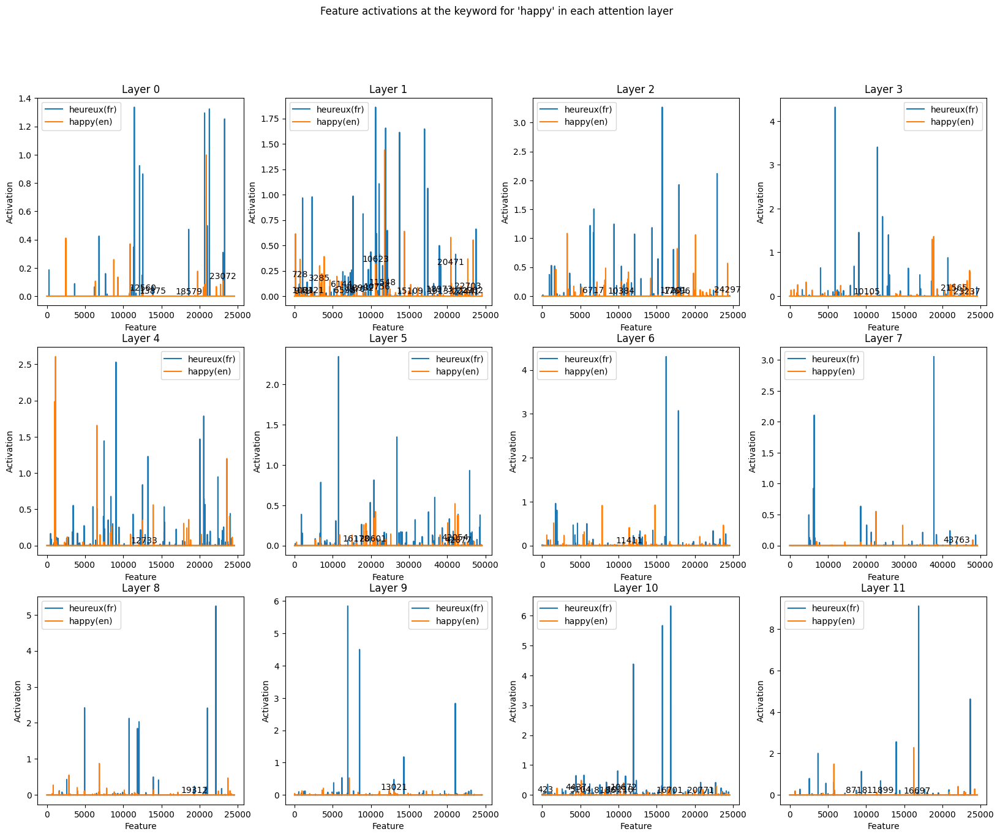

In [465]:
fig, axs = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle("Feature activations at the keyword for 'happy' in each attention layer")

for layer_id in range(model.cfg.n_layers):
    sae, cfg_dict, sparsity = SAE.from_pretrained(
        release = "gpt2-small-hook-z-kk",
        sae_id = f"blocks.{layer_id}.hook_z",
        device = device
)
    _, cache_fr = model.run_with_cache_with_saes(prompt_happy_fr, saes=[sae])
    _, cache = model.run_with_cache_with_saes(prompt_happy, saes=[sae])

    # for key, value in cache.items():
    #     if "blocks.0" in key:
    #         print(key, value.shape)

    cache_to_study_fr = cache_fr[f'blocks.{layer_id}.attn.hook_z.hook_sae_acts_post']
    cache_to_study = cache[f'blocks.{layer_id}.attn.hook_z.hook_sae_acts_post']
    # print("cache:", cache_to_study_fr.shape)  # (bsz, len, d_sae)

    # Select the activations of the happy keywords
    idx_tensor_fr = torch.tensor(happy_fr_idxs).unsqueeze(2).expand(-1, 3, cache_to_study_fr.shape[2])
    cache_happy_fr_filtered = torch.gather(cache_to_study_fr, 1, idx_tensor_fr)
    # print("cache_filtered", cache_happy_fr_filtered.shape)
    cache_happy_fr_average = cache_happy_fr_filtered.sum(dim=1).mean(dim=0).squeeze()
    # print(cache_happy_fr_average.shape)

    idx_tensor = torch.tensor(happy_idxs).unsqueeze(1).unsqueeze(2).expand(-1, 1, cache_to_study.shape[2])
    cache_happy_filtered = torch.gather(cache_to_study, 1, idx_tensor)
    cache_happy_average = cache_happy_filtered.mean(dim=0).squeeze()
    
    # put the subplot in the big figure
    row_id = layer_id // 4
    col_id = layer_id % 4
    
    # put the feature activations of French and English in the same plot
    axs[row_id, col_id].plot(cache_happy_fr_average.tolist(), label="heureux(fr)")
    axs[row_id, col_id].plot(cache_happy_average.tolist(), label="happy(en)")
    axs[row_id, col_id].set_title(f"Layer {layer_id}")
    axs[row_id, col_id].set_xlabel("Feature")
    axs[row_id, col_id].set_ylabel("Activation")
    # set tag
    axs[row_id, col_id].legend()
    
    # find the features(both>0) and their indexes
    happy_acts = cache_happy_average[cache_happy_average > 0]
    happy_ids = torch.nonzero(cache_happy_average).squeeze()
    
    happy_acts_fr= cache_happy_fr_average[cache_happy_fr_average > 0]
    happy_fr_ids = torch.nonzero(cache_happy_fr_average).squeeze()
    
    common_feats = set(happy_ids.tolist()).intersection(set(happy_fr_ids.tolist()))
    print(f"Layer {layer_id} common features:", common_feats)
    
    # write index id next to the bar in the plot
    for common_idx in common_feats:
        feat_act = min(cache_happy_fr_average[common_idx], cache_happy_average[common_idx])
        axs[row_id, col_id].text(common_idx, feat_act, f"{common_idx}", ha="center", va="bottom")


Layer 0 common features: {13953, 7550, 20998, 3336, 11722, 11978, 14924, 5610, 14570, 15603, 16627, 24182, 7479, 15033, 18458, 14170, 7034, 4319}
Layer 1 common features: {5601, 13409, 20931, 11588, 24387, 21958, 4581, 16230, 22119, 8298, 11114, 17742, 7538, 24149, 19223, 344, 23577, 23420}
Layer 2 common features: {14468, 15887, 23578, 13853, 10142, 1697, 6328, 16185, 15420, 21954, 11719, 1483, 14550, 14807, 352, 20199, 750, 9457, 21363, 2682, 24191}
Layer 3 common features: {19168, 11617, 15585, 11876, 1382, 24455, 11438, 7854, 9969, 8274, 5075, 14196, 12508, 21533}
Layer 4 common features: {5610, 15308, 24272, 6289, 19184, 24304, 381, 21400, 9177, 1787, 18653, 17695}
Layer 5 common features: {4992, 9506, 1411, 15077, 205, 9723, 13977, 2011, 11036}
Layer 6 common features: {17504, 3585, 18146, 23494, 6861, 18486, 22873, 16383, 14332, 21631}
Layer 7 common features: {11553, 228, 16488, 12394, 16789, 8023, 5661, 17151}
Layer 8 common features: {4768, 15075, 19683, 16325, 1351, 4234, 86

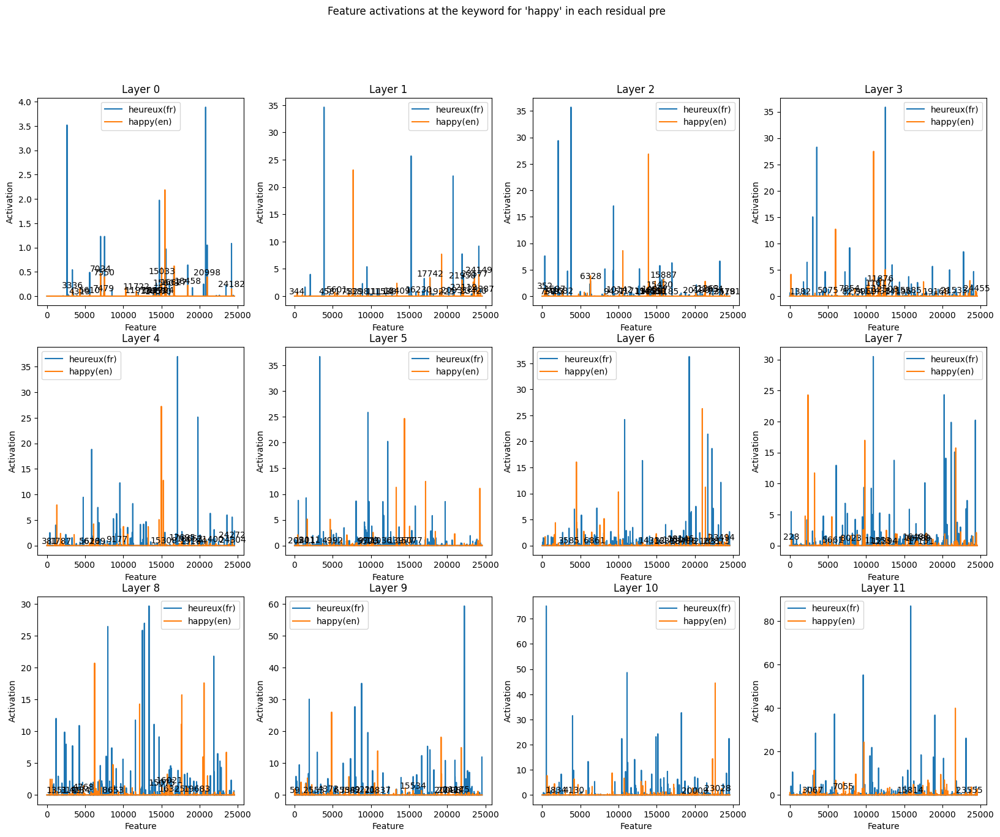

In [466]:
fig, axs = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle("Feature activations at the keyword for 'happy' in each residual pre")

for layer_id in range(model.cfg.n_layers):
    sae, cfg_dict, sparsity = SAE.from_pretrained(
        release = "gpt2-small-res-jb",
        sae_id = f"blocks.{layer_id}.hook_resid_pre",
        device = device
)
    _, cache_fr = model.run_with_cache_with_saes(prompt_happy_fr, saes=[sae])
    _, cache = model.run_with_cache_with_saes(prompt_happy, saes=[sae])

    # for key, value in cache.items():
    #     if "blocks.0" in key:
    #         print(key, value.shape)

    cache_to_study_fr = cache_fr[f'blocks.{layer_id}.hook_resid_pre.hook_sae_acts_post']
    cache_to_study = cache[f'blocks.{layer_id}.hook_resid_pre.hook_sae_acts_post']
    # print("cache:", cache_to_study_fr.shape)  # (bsz, len, d_sae)

    # Select the activations of the happy keywords
    idx_tensor_fr = torch.tensor(happy_fr_idxs).unsqueeze(2).expand(-1, 3, cache_to_study_fr.shape[2])
    cache_happy_fr_filtered = torch.gather(cache_to_study_fr, 1, idx_tensor_fr)
    # print("cache_filtered", cache_happy_fr_filtered.shape)
    cache_happy_fr_average = cache_happy_fr_filtered.sum(dim=1).mean(dim=0).squeeze()
    # print(cache_happy_fr_average.shape)

    idx_tensor = torch.tensor(happy_idxs).unsqueeze(1).unsqueeze(2).expand(-1, 1, cache_to_study.shape[2])
    cache_happy_filtered = torch.gather(cache_to_study, 1, idx_tensor)
    cache_happy_average = cache_happy_filtered.mean(dim=0).squeeze()
    
    # put the subplot in the big figure
    row_id = layer_id // 4
    col_id = layer_id % 4
    
    # put the feature activations of French and English in the same plot
    axs[row_id, col_id].plot(cache_happy_fr_average.tolist(), label="heureux(fr)")
    axs[row_id, col_id].plot(cache_happy_average.tolist(), label="happy(en)")
    axs[row_id, col_id].set_title(f"Layer {layer_id}")
    axs[row_id, col_id].set_xlabel("Feature")
    axs[row_id, col_id].set_ylabel("Activation")
    # set tag
    axs[row_id, col_id].legend()
    
    # find the features(both>0) and their indexes
    happy_acts = cache_happy_average[cache_happy_average > 0]
    happy_ids = torch.nonzero(cache_happy_average).squeeze()
    
    happy_acts_fr= cache_happy_fr_average[cache_happy_fr_average > 0]
    happy_fr_ids = torch.nonzero(cache_happy_fr_average).squeeze()
    
    common_feats = set(happy_ids.tolist()).intersection(set(happy_fr_ids.tolist()))
    print(f"Layer {layer_id} common features:", common_feats)
    
    # write index id next to the bar in the plot
    for common_idx in common_feats:
        feat_act = min(cache_happy_fr_average[common_idx], cache_happy_average[common_idx])
        axs[row_id, col_id].text(common_idx, feat_act, f"{common_idx}", ha="center", va="bottom")


In [486]:
# write 5 prompts contain "bien" in French
prompt_good_fr = ["C’est très bien ! ",
                "Ça va bien.",
                "Elle est bien en français.",
                "Le film est très bien.",
                "Je suis bien en programmation."]
prompt_good = ["I'm good.",
            "It's good.",
            "She is good at French.",
            "The movie is very good.",
            "I'm good at programming."]
fr_tokens_good = model.to_str_tokens(prompt_good_fr)
en_tokens_good = model.to_str_tokens(prompt_good)
for i, tokens in enumerate(fr_tokens_good):
    print(f"Prompt {i}: {tokens}")
print("----"*40)
for i, tokens in enumerate(en_tokens_good):
    print(f"Prompt {i}: {tokens}")
print("----"*40)

good_idxs_fr = get_multi_keyword_id(prompt_good_fr, [" b", "ien"])
good_idxs = get_keyword_id(prompt_good, [" good"])
print(good_idxs_fr)
print(good_idxs)

Prompt 0: ['<|endoftext|>', 'C', '�', '�', 'est', ' tr', 'è', 's', ' b', 'ien', ' !', ' ']
Prompt 1: ['<|endoftext|>', '�', '�', 'a', ' va', ' b', 'ien', '.']
Prompt 2: ['<|endoftext|>', 'El', 'le', ' est', ' b', 'ien', ' en', ' fr', 'an', 'ç', 'ais', '.']
Prompt 3: ['<|endoftext|>', 'Le', ' film', ' est', ' tr', 'è', 's', ' b', 'ien', '.']
Prompt 4: ['<|endoftext|>', 'Je', ' su', 'is', ' b', 'ien', ' en', ' program', 'm', 'ation', '.']
----------------------------------------------------------------------------------------------------------------------------------------------------------------
Prompt 0: ['<|endoftext|>', 'I', "'m", ' good', '.']
Prompt 1: ['<|endoftext|>', 'It', "'s", ' good', '.']
Prompt 2: ['<|endoftext|>', 'She', ' is', ' good', ' at', ' French', '.']
Prompt 3: ['<|endoftext|>', 'The', ' movie', ' is', ' very', ' good', '.']
Prompt 4: ['<|endoftext|>', 'I', "'m", ' good', ' at', ' programming', '.']
------------------------------------------------------------------

In [508]:
layer_id = 4
sae, cfg_dict, sparsity = SAE.from_pretrained(
    release = "gpt2-small-res-jb",
    sae_id = f"blocks.{layer_id}.hook_resid_pre",
    device = device
)
_, cache_fr = model.run_with_cache_with_saes(prompt_good_fr, saes=[sae])
_, cache = model.run_with_cache_with_saes(prompt_good, saes=[sae])

cache_to_study_fr = cache_fr[f'blocks.{layer_id}.hook_resid_pre.hook_sae_acts_post']
cache_to_study = cache[f'blocks.{layer_id}.hook_resid_pre.hook_sae_acts_post'] # (bsz, len, d_sae)

# Select the activations of the happy keywords
idx_tensor_fr = torch.tensor(good_idxs_fr).unsqueeze(2).expand(-1, len(good_idxs_fr[0]), cache_to_study_fr.shape[2])
cache_good_fr_filtered = torch.gather(cache_to_study_fr, 1, idx_tensor_fr)  # (bsz, len, d_sae)
cache_good_fr_average = cache_good_fr_filtered.sum(dim=1).mean(dim=0).squeeze()
# use weighted average
# cache_good_fr_average = torch.zeros(size=(cache_good_fr_filtered.shape[0], sae.cfg.d_sae))
# for sample_id in range(cache_good_fr_filtered.shape[0]):
#     sample = cache_good_fr_filtered[sample_id]  # (len, d_sae)
#     sum_on_subword_dim = torch.sum(sample, dim=0)  # (d_sae,)
#     for subword_id in range(sample.shape[0]):
#         cache_good_fr_average[sample_id] += sample[subword_id] * (sample[subword_id] / sum_on_subword_dim)
# cache_good_fr_average = cache_good_fr_average.mean(dim=0)

idx_tensor = torch.tensor(good_idxs).unsqueeze(1).unsqueeze(2).expand(-1, 1, cache_to_study.shape[2])
cache_good_filtered = torch.gather(cache_to_study, 1, idx_tensor)
cache_good_average = cache_good_filtered.mean(dim=0).squeeze()

df_feature_activation = pd.DataFrame(cache_good_fr_average.tolist(),
                                        columns = ["heureux(fr)"],
                                        index = [f"feature_{i}" for i in range(sae.cfg.d_sae)],
    )
df_feature_activation["happy(en)"] = cache_good_average.tolist()

fig = px.line(
    df_feature_activation,
    title="Feature activations at the keyword for 'good' or 'bien' in layer 4",
    labels={"index": "Feature", "value": "Activation"},
)

# write index id next to the bar in the plot
good_acts_fr, good_ids_fr = torch.topk(cache_good_fr_average, 3)
annotations = []
for id_fr, val_fr in zip(good_ids_fr, good_acts_fr):
    annotations.append(dict(x=id_fr, y=val_fr, text=f"{id_fr}", 
                            xanchor='center', yanchor='bottom'))

fig.update_layout(annotations=annotations)
    
fig.show()

In [509]:
html = get_dashboard_html(sae_release = "gpt2-small", sae_id="7-res-jb", feature_idx=14888)
display(IFrame(html, width=1200, height=300))

## Steering a French prompt with English features

In [565]:
import functools

def steering_hook(resid_pre,
                  hook,
                  steering_vector):
    if resid_pre.shape[1] == 1:
        return
    
    print("======"*10)
    print("resid_pre:", resid_pre.shape)
    print("steering_vector:", steering_vector.shape)
    resid_pre[:, :, :] += steering_vector


def hooked_generate(model, prompt_batch, fwd_hooks=[], seed=None, **kwargs):
    if seed is not None:
        torch.manual_seed(seed)

    with model.hooks(fwd_hooks=fwd_hooks):
        tokens = model.to_tokens(prompt_batch)
        result = model.generate(
            stop_at_eos=True,
            input=tokens,
            max_new_tokens=15,
            do_sample=True,
            **kwargs)
    return result


def run_sterring_generate(model, prompt, batchsize, hook_layer_id, steering_vector, **kwargs):
    model.reset_hooks()
    tmp_hook_func = functools.partial(steering_hook, steering_vector=steering_vector)
    editing_hooks = [(f"blocks.{hook_layer_id}.hook_resid_pre", tmp_hook_func)]
    res = hooked_generate(model=model,
                          prompt_batch=[prompt]*batchsize,
                          fwd_hooks=editing_hooks,
                          seed=None,
                          **kwargs)
    res_str = model.to_string(res[:, 1:])
    print(("\n" + "-" * 40 + "\n").join(res_str))
    return res_str

In [569]:
prompt = "C'est mardi et je suis"
prompt = "Today is Tuesday and I am"

happy_ids = 2392
happy_ids = [2392, 9840, 21753]

sad_ids = 2045

layer_id = 7

sae, cfg_dict, _ = SAE.from_pretrained(
    release = "gpt2-small-res-jb",
    sae_id = f"blocks.{layer_id}.hook_resid_pre",
    device = device
)
steering_vector = sae.W_dec[sad_ids]
print(steering_vector.shape)

coeff = 100
# coeff = [300, 200, 100]
if isinstance(coeff, int):
    steering_vector = steering_vector * coeff
else:
    steering_vector = torch.tensor(coeff).unsqueeze(1).expand(-1, steering_vector.shape[1]) * steering_vector
    steering_vector = steering_vector.sum(dim=0)
print("steering vector:", steering_vector.shape)

sampling_kwargs = dict(temperature=2.0, top_p=0.1, freq_penalty=1.0)

run_sterring_generate(model=model,
                      prompt=prompt,
                      batchsize=5,
                      hook_layer_id=layer_id,
                      steering_vector = steering_vector,
                      **sampling_kwargs)

torch.Size([768])
steering vector: torch.Size([768])


  0%|          | 0/15 [00:00<?, ?it/s]

resid_pre: torch.Size([5, 7, 768])
steering_vector: torch.Size([768])
Today is Tuesday and I am as good a person to die by my family (except that I had to
----------------------------------------
Today is Tuesday and I am to announce that We are proud not long after midnight on Wednesday morning that part
----------------------------------------
Today is Tuesday and I am to be buried. This day's action, like any great soul searching on
----------------------------------------
Today is Tuesday and I amistic old dogs sometimes become attached to bodies they never knew existed. For that
----------------------------------------
Today is Tuesday and I am to go back in time to 1977 because it happened so close. The whole


['Today is Tuesday and I am as good a person to die by my family (except that I had to',
 'Today is Tuesday and I am to announce that We are proud not long after midnight on Wednesday morning that part',
 "Today is Tuesday and I am to be buried. This day's action, like any great soul searching on",
 'Today is Tuesday and I amistic old dogs sometimes become attached to bodies they never knew existed. For that',
 'Today is Tuesday and I am to go back in time to 1977 because it happened so close. The whole']

"C'est mardi et je suis with la vie, il est une happyité"
 "C'est mardi et je suis de la fait de l'esprit des vivants,
"C'est mardi et je suis couste il peut in effantment qui nouveau pass

'Today is Tuesday and I am to have achieved this success. It means, however, that a second way',
 'Today is Tuesday and I am to have completed this job thanks to their eSoup thank you program.',
 'Today is Tuesday and I am to get some sleep, because so many friends got the happy cause from tomorrow',
 "Today is Tuesday and I am to announce another project in Hiddu after ten rounds! It's simple",

'Today is Tuesday and I am sad to announce that someone was killed in a car crash at C&C',
 'Today is Tuesday and I amistic, so you may have noticed something about its very small body of work',
 "Today is Tuesday and I am to be buried. This day's action, like any great soul searching on",
 'Today is Tuesday and I amistic old dogs sometimes become attached to bodies they never knew existed. For that',
 Today is Tuesday and I am as good a person to die by my family (except that I had to',